 # Online Shoppers Purchasing Intention

 ### Name: *AISWARYA PRASAD*
 ### Organization: Entri Elevate
 ### Evaluation date :

## Overview of Problem Statement

Predicting customer purchase behavior is essential for improving e-commerce conversion rates and user experience.
By analyzing browsing data, businesses can identify factors influencing purchases and enhance marketing strategies.

## Objective
 To develop a machine learning model to predict whether an online shopper will complete a purchase. The goal is to leverage session and user behavior data to create an accurate predictive model. The objective is to create an accurate model that aids e-commerce platforms in targeting potential buyers more effectively.

##  Data Description
 Data Source: UCI Machine Learning Repository - Online Shoppers Purchasing Intention Dataset
 - Number of Rows: 12,330
 - Number of Columns: 18
 
***Target Variable: Revenue (1 = Purchase, 0 = No Purchase)***
 
***Key Features:***
 - Administrative, Informational, ProductRelated: Pages visited in respective categories.
 - BounceRates, ExitRates, PageValues: Metrics reflecting engagement and likelihood to buy.
 - SpecialDay: Highlights special events that may influence purchases.
 - Month, OperatingSystems, Browser, Region, TrafficType, VisitorType, Weekend: Session-related categorical attributes.


In [1]:
# Importing the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier
from scipy import stats

## Data Collection

In [3]:
# Load the dataset
data_path = r"C:\Users\asus\Downloads\online_shoppers_intention.csv"
data = pd.read_csv(data_path)

## Overview of the Data

In [47]:
print("Dataset Overview:")
print(data.info())
print("\nFirst 5 rows of data:")
print(data.head())

Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  float64
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  float64
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  float64
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  int64  
 11  OperatingSystems         12330 non-null  float64
 12  Browser                  12330 non-null  float64
 13  Region                   12330 non-null  int64  
 14  Traf

## Data Preprocessing

In [5]:
# Check for missing values
print("Missing values in each column:")
print(data.isnull().sum())

Missing values in each column:
Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64


In [48]:
# Handle missing values
data = data.dropna()
print("After handling missing values, dataset shape:", data.shape)

After handling missing values, dataset shape: (12330, 18)


In [52]:
# Remove duplicate rows
data = data.drop_duplicates()

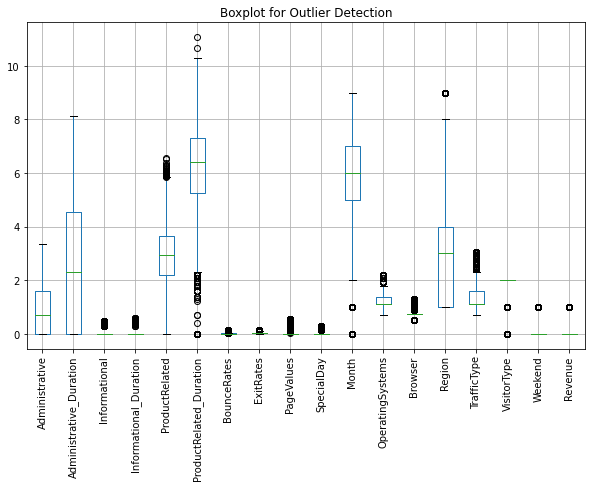

In [53]:
# Check for outliers using boxplot
plt.figure(figsize=(10, 6))
data.boxplot(rot=90)
plt.title('Boxplot for Outlier Detection')
plt.show()

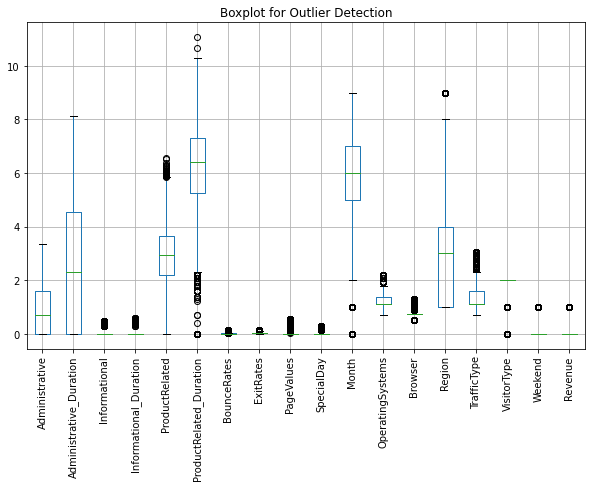

In [54]:
# Check for outliers using boxplot
plt.figure(figsize=(10, 6))
data.boxplot(rot=90)
plt.title('Boxplot for Outlier Detection')
plt.show()

In [55]:
# Check for skewness in numerical features
numerical_features = data.select_dtypes(include=[np.number]).columns
skewness = data[numerical_features].skew()
print("Skewness of numerical features:")
print(skewness)

Skewness of numerical features:
Administrative             0.554406
Administrative_Duration    0.237283
Informational              1.469582
Informational_Duration     1.543931
ProductRelated            -0.040151
ProductRelated_Duration   -1.427148
BounceRates                2.782239
ExitRates                  1.787429
PageValues                 1.383086
SpecialDay                 2.837301
Month                     -0.832914
OperatingSystems           0.274592
Browser                    0.896259
Region                     0.978480
TrafficType                0.904720
VisitorType               -2.051012
Weekend                    1.255097
Revenue                    1.892862
dtype: float64


In [56]:
#Address skewed data through log transformation
for feature in numerical_features:
    if data[feature].skew() > 1:
        data[feature] = np.log1p(data[feature])

## Exploratory Data Analysis (EDA)

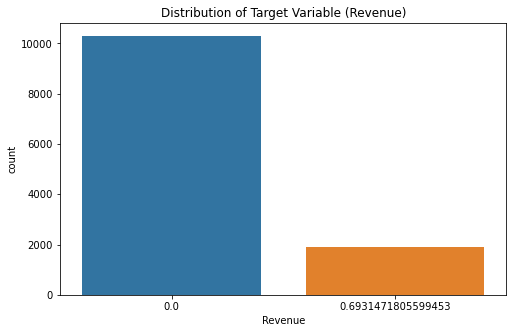

In [57]:
# Plot target variable distribution
plt.figure(figsize=(8, 5))
sns.countplot(x='Revenue', data=data)
plt.title('Distribution of Target Variable (Revenue)')
plt.show()

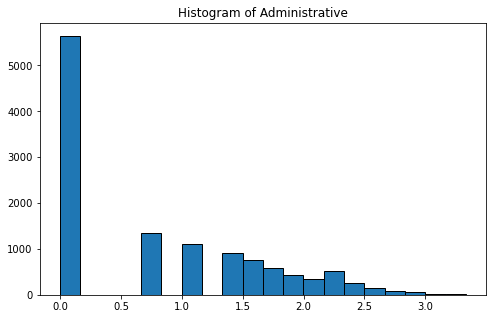

In [58]:
# Histogram
plt.figure(figsize=(8, 5))
plt.hist(data['Administrative'], bins=20, edgecolor='k')
plt.title('Histogram of Administrative')
plt.show()

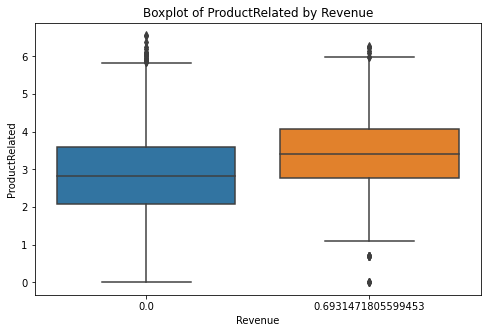

In [59]:
# Boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x='Revenue', y='ProductRelated', data=data)
plt.title('Boxplot of ProductRelated by Revenue')
plt.show()

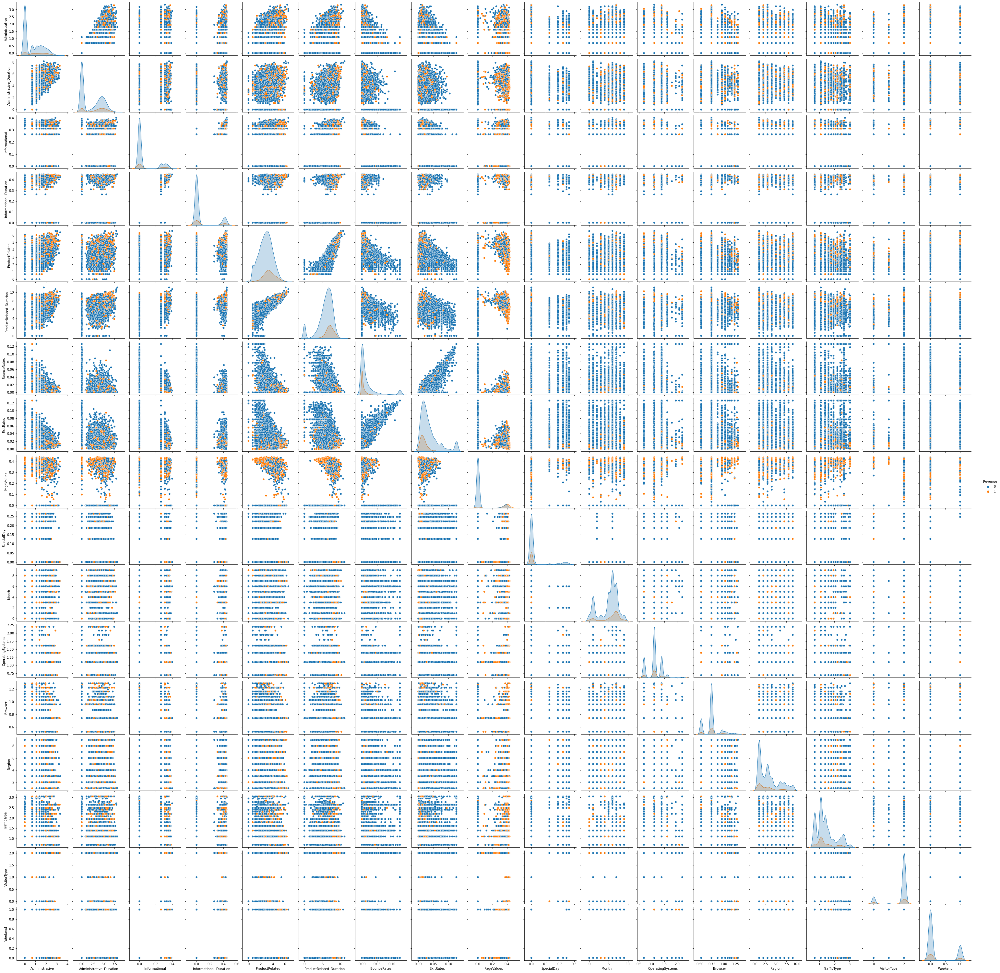

In [72]:
# Pair Plot
sns.pairplot(data, hue='Revenue')
plt.show()

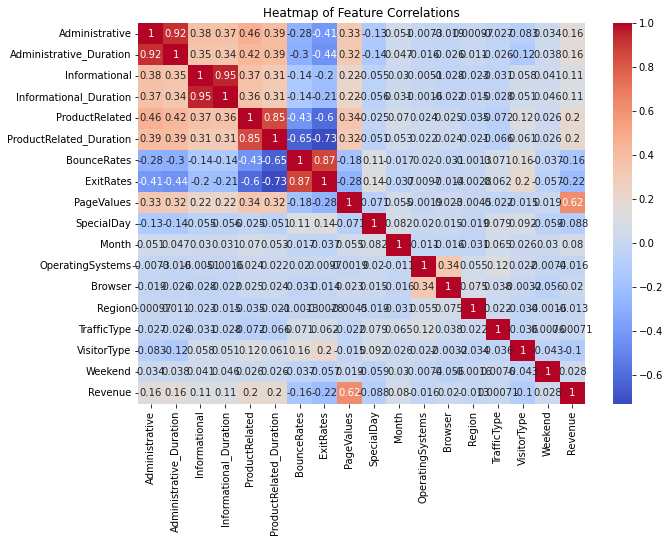

In [73]:
# Correlation heatmap (numerical features)
plt.figure(figsize=(10, 7))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Heatmap of Feature Correlations')
plt.show()

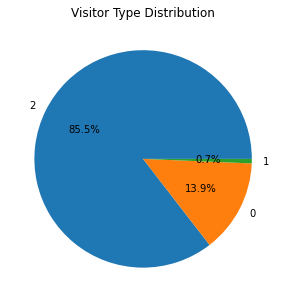

In [74]:
# Pie Chart
plt.figure(figsize=(8, 5))
data['VisitorType'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Visitor Type Distribution')
plt.ylabel('')
plt.show()

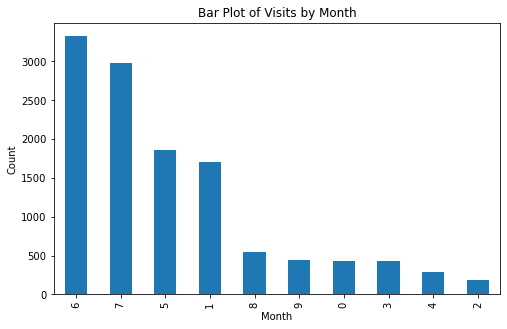

In [75]:
# Bar Plot
plt.figure(figsize=(8, 5))
data['Month'].value_counts().plot(kind='bar')
plt.title('Bar Plot of Visits by Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

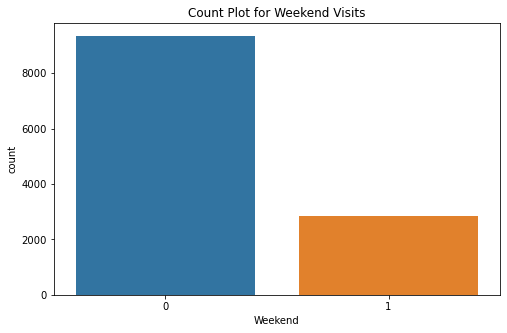

In [76]:
# Count Plot
plt.figure(figsize=(8, 5))
sns.countplot(x='Weekend', data=data)
plt.title('Count Plot for Weekend Visits')
plt.show()

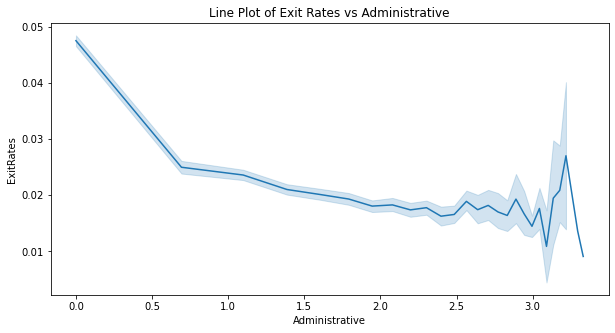

In [77]:
# Line Plot
plt.figure(figsize=(10, 5))
sns.lineplot(x='Administrative', y='ExitRates', data=data)
plt.title('Line Plot of Exit Rates vs Administrative')
plt.show()

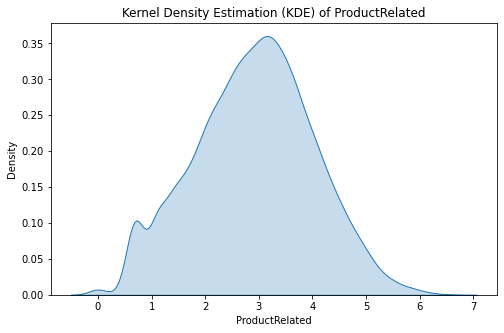

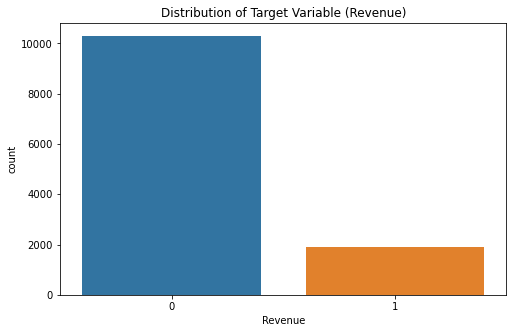

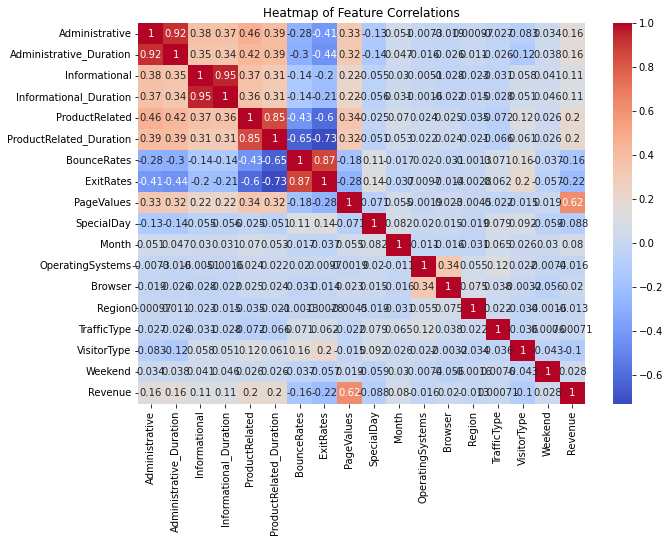

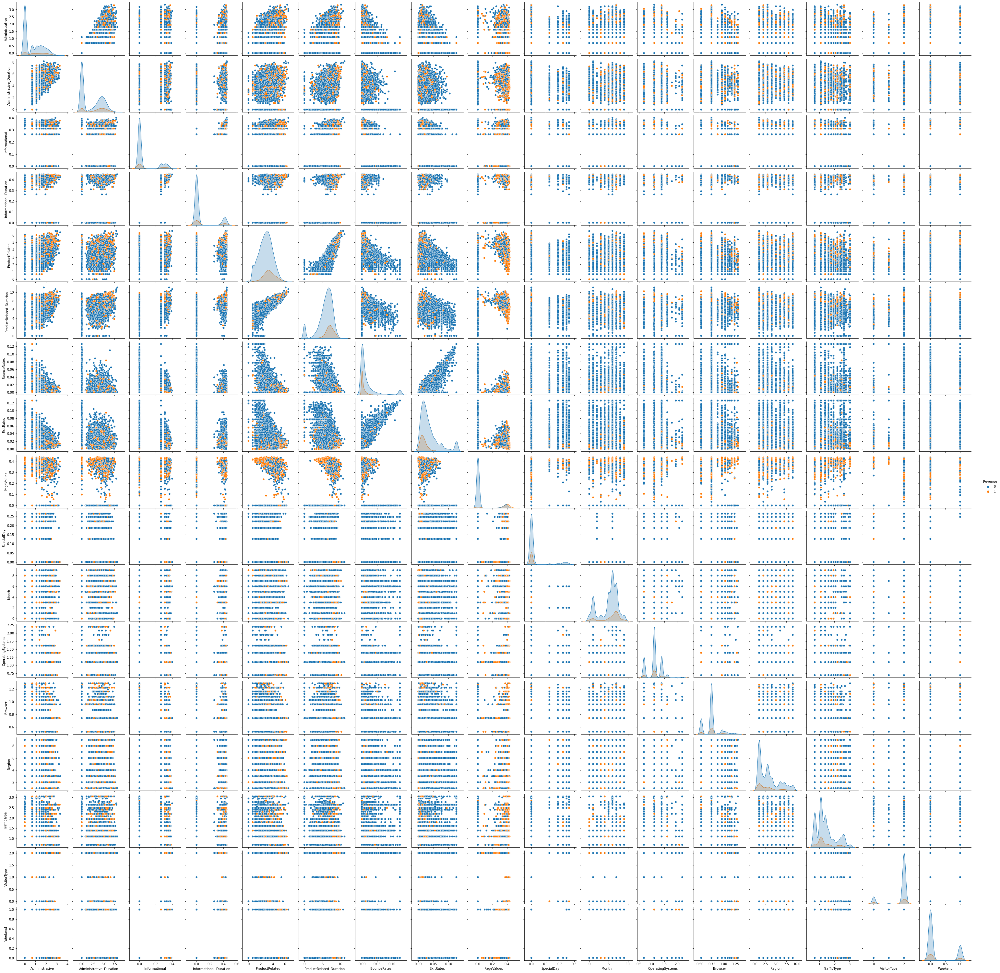

In [78]:
# KDE Plot
plt.figure(figsize=(8, 5))
sns.kdeplot(data['ProductRelated'], shade=True)
plt.title('Kernel Density Estimation (KDE) of ProductRelated')
plt.show()
plt.figure(figsize=(8, 5))
sns.countplot(x='Revenue', data=data)
plt.title('Distribution of Target Variable (Revenue)')
plt.show()

plt.figure(figsize=(10, 7))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Heatmap of Feature Correlations')
plt.show()

sns.pairplot(data, hue='Revenue')

plt.show()

## Feature Engineering

In [79]:
categorical_cols = ['Month', 'VisitorType', 'Weekend']
encoder = LabelEncoder()
for col in categorical_cols:
    data[col] = encoder.fit_transform(data[col])

# Encode target variable
data['Revenue'] = encoder.fit_transform(data['Revenue'])

print("Categorical columns encoded successfully!")
print("Sample of encoded columns:", data[categorical_cols].head())

Categorical columns encoded successfully!
Sample of encoded columns:    Month  VisitorType  Weekend
0      2            2        0
1      2            2        0
2      2            2        0
3      2            2        0
4      2            2        1


## Feature Selection

In [68]:
X = data.drop('Revenue', axis=1)
y = data['Revenue']
selector = SelectKBest(score_func=f_classif, k=10)
X_selected = selector.fit_transform(X, y)
selected_features = X.columns[selector.get_support()]

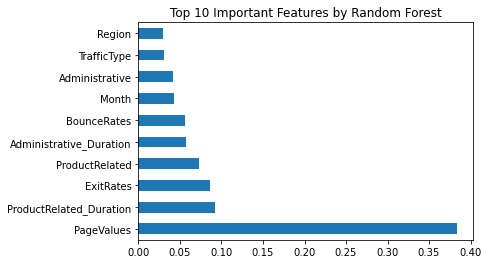

In [80]:
# Random Forest for feature importance
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)
importances = pd.Series(rf.feature_importances_, index=X.columns)
importances.nlargest(10).plot(kind='barh')
plt.title('Top 10 Important Features by Random Forest')
plt.show()

## Train-Test Split

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.3, random_state=42)

## Feature Scaling

In [81]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print("\nData Preprocessing and Feature Selection Completed.")


Data Preprocessing and Feature Selection Completed.


## ML Model Building

In [82]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score

In [85]:
# Initialize models
models = {'Logistic Regression': LogisticRegression(max_iter=1000),
    'Support Vector Machine': SVC(),
    'Decision Tree': DecisionTreeClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB()}

In [87]:
# Train and evaluate each model
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"{name} Accuracy: {accuracy_score(y_test, y_pred):.2f}")
    print(f"{name} Classification Report:\n{classification_report(y_test, y_pred)}\n")

Logistic Regression Accuracy: 0.90
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3116
           1       0.65      0.66      0.66       546

    accuracy                           0.90      3662
   macro avg       0.80      0.80      0.80      3662
weighted avg       0.90      0.90      0.90      3662


Support Vector Machine Accuracy: 0.90
Support Vector Machine Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3116
           1       0.74      0.56      0.64       546

    accuracy                           0.90      3662
   macro avg       0.83      0.76      0.79      3662
weighted avg       0.90      0.90      0.90      3662


Decision Tree Accuracy: 0.86
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.91      0.92      3116
       

## Model Evaluation

In [89]:
from sklearn.metrics import precision_score, recall_score, f1_score

for name, model in models.items():
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

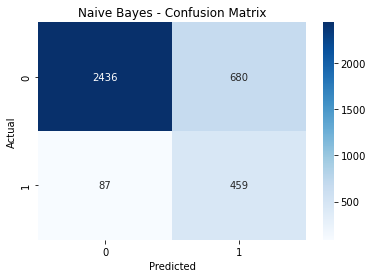

In [92]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title(f"{name} - Confusion Matrix")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [94]:
# Classification Metrics
print(f"{name} Accuracy: {accuracy_score(y_test, y_pred):.2f}")
print(f"{name} Precision: {precision_score(y_test, y_pred):.2f}")
print(f"{name} Recall: {recall_score(y_test, y_pred):.2f}")
print(f"{name} F1-Score: {f1_score(y_test, y_pred):.2f}")
print(f"{name} Classification Report:\n{classification_report(y_test, y_pred)}\n")

Naive Bayes Accuracy: 0.79
Naive Bayes Precision: 0.40
Naive Bayes Recall: 0.84
Naive Bayes F1-Score: 0.54
Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.78      0.86      3116
           1       0.40      0.84      0.54       546

    accuracy                           0.79      3662
   macro avg       0.68      0.81      0.70      3662
weighted avg       0.88      0.79      0.82      3662




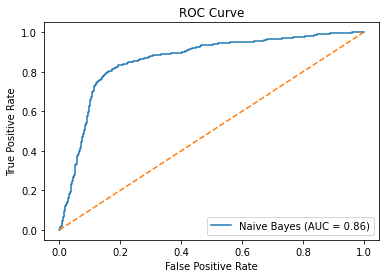

In [96]:
# ROC Curve
if y_pred_proba is not None:
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc_score(y_test, y_pred_proba):.2f})')

plt.plot([0, 1], [0, 1], linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()